In [1]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from importlib import reload
from tqdm import tqdm
from scipy.ndimage import gaussian_filter1d
from skimage.morphology import binary_opening, binary_closing
from scipy.ndimage.filters import gaussian_filter

In [2]:
import pickle
from skimage.feature import peak_local_max
from copy import deepcopy

In [3]:
NOTEBOOK_DIR = os.getcwd()
MODULE_DIR, _ = os.path.split(NOTEBOOK_DIR)
OUT_DIR = os.path.join(MODULE_DIR, "outputs")
sys.path.append(MODULE_DIR)

In [4]:
from longterm import load, utils
from longterm.utils import list_attr, list_fn, list_mthd, list_join
from longterm import plot as myplt
from longterm import rois

In [5]:
fly_dir = os.path.join(load.NAS2_DIR_LH, "210512", "fly3")
fly_processed_dir = os.path.join(fly_dir, load.PROCESSED_FOLDER)
pkl_dir = os.path.join(fly_processed_dir, "compare_trials.pkl")
with open(pkl_dir, "rb") as f:
    summary_dict = pickle.load(f)
mask_dir = os.path.join(fly_processed_dir, "dff_mask_denoised_t1.tif")
mask = utils.get_stack(mask_dir) == 0

trial_dirs = utils.readlines_tolist(os.path.join(fly_dir, "trial_dirs.txt"))
i_trials = [0,2,3,4,5,8,9,11,13]  # [0,2,3,4,5,8,11]
selected_trial_dirs = [trial_dirs[i] for i in i_trials]
processed_dirs = list_join(selected_trial_dirs, load.PROCESSED_FOLDER)
green_denoised_dirs = list_join(processed_dirs, "green_denoised_t1.tif")


roi_file = os.path.join(fly_processed_dir, "ROI_centers.txt")
roi_centers = rois.read_roi_center_file(roi_file)

Read the centers of 87 ROIs from file


In [6]:
greens = list_fn(green_denoised_dirs, utils.get_stack)

KeyboardInterrupt: 

In [57]:
green_dirs = list_join(processed_dirs, "green_com_warped.tif")
greens_raw = list_fn(green_denoised_dirs, utils.get_stack)


In [6]:
local_corrs = summary_dict["green_local_corrs"]
local_corr_all = np.mean(local_corrs, axis=0)
local_corr_all[mask] = 0
stds = summary_dict["green_stds"]
std_all = np.mean(stds, axis=0)
std_all[mask] = 0
maxs = summary_dict["green_quants"]
max_all = np.max(maxs, axis=0)
max_all[mask] = 0

In [7]:
local_peak_std = peak_local_max(std_all, min_distance=5, threshold_abs=0.001)
local_peak_max = peak_local_max(max_all, min_distance=5, threshold_abs=0.001)
local_peak_corr = peak_local_max(local_corr_all, min_distance=5, threshold_abs=0.001)

<IPython.core.display.Javascript object>


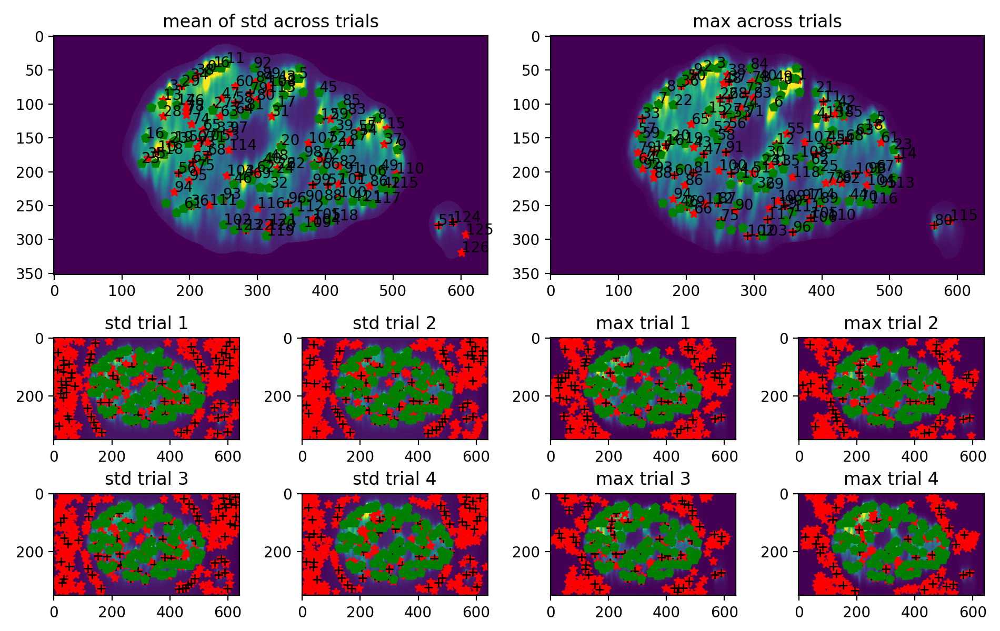

In [8]:
%matplotlib notebook
quantile = 0.99
SHOW_MAX = True
CONFIRMED = True

fig = plt.figure(figsize=(9.5, 6))  # contstained_layout=True)
layout = """
    AABB
    AABB
    CDEF
    GHIJ
    """
axs_names = "ABCDEFGHIJ"
ax_dict = fig.subplot_mosaic(layout)  # , sharex=True, sharey=True)

for i_ax, ax_name in enumerate(axs_names):
    if i_ax:
        # ax_dict[ax_name].set_xticklabels([])
        # ax_dict[ax_name].set_yticklabels([])
        ax_dict[axs_names[0]].get_shared_x_axes().join(ax_dict[axs_names[0]], ax_dict[ax_name])
        ax_dict[axs_names[0]].get_shared_y_axes().join(ax_dict[axs_names[0]], ax_dict[ax_name])
   

for i_ax, ax_name in enumerate(axs_names):
    ax = ax_dict[axs_names[i_ax]]
    if i_ax == 0:
        im = std_all
        title = "mean of std across trials"
    elif i_ax == 1:
        im = max_all
        title = "max across trials"
    else:
        i_row = (i_ax - 2) // 4
        i_col = (i_ax - 2) % 4
        if i_col < 2:  # target all the left small subplots
            i_trial = i_row * 2 + i_col
            im = stds[i_trial]
            title = "std trial {}".format(i_trial + 1)
        else:
            i_trial = i_row * 2 + i_col - 2
            im = maxs[i_trial]
            title = "max trial {}".format(i_trial + 1)
    ax.imshow(im, clim=[0, np.quantile(im, quantile)])
    ax.set_title(title)
    
    if SHOW_MAX:
        if i_ax == 0:
            coordinates5 = local_peak_std
        elif i_ax == 1:
            coordinates5 = local_peak_max
        else:
            coordinates5 = peak_local_max(im, min_distance=5, threshold_abs=0.001)
        coordinates10 = peak_local_max(im, min_distance=10, threshold_abs=0.001)
        _ = [ax.plot(pixel[1], pixel[0], 'r*') for pixel in coordinates5]
        _ = [ax.plot(pixel[1], pixel[0], 'k+') for pixel in coordinates10]
        if i_ax <= 1:
            for i in range(len(coordinates5)):
                ax.annotate(str(i), np.flip(coordinates5[i]))
    if CONFIRMED:
        _ = [ax.plot(pixel[1], pixel[0], 'gp') for pixel in roi_centers]
        
      
fig.tight_layout()

<IPython.core.display.Javascript object>


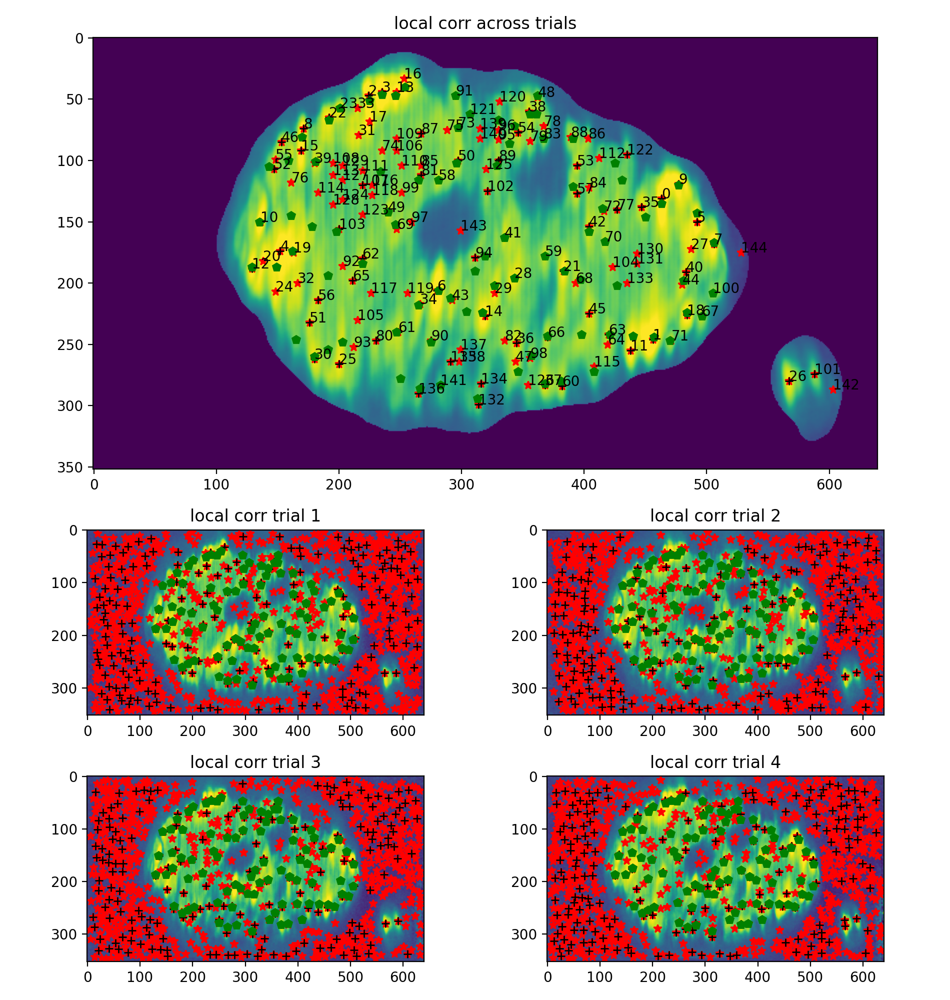

In [9]:
%matplotlib notebook
quantile = 0.99
SHOW_MAX = True
CONFIRMED = True

fig = plt.figure(figsize=(9.5, 10))  # contstained_layout=True)
layout = """
    AA
    AA
    BC
    DE
    """
axs_names = "ABCDE"
ax_dict = fig.subplot_mosaic(layout)  # , sharex=True, sharey=True)

for i_ax, ax_name in enumerate(axs_names):
    if i_ax:
        # ax_dict[ax_name].set_xticklabels([])
        # ax_dict[ax_name].set_yticklabels([])
        ax_dict[axs_names[0]].get_shared_x_axes().join(ax_dict[axs_names[0]], ax_dict[ax_name])
        ax_dict[axs_names[0]].get_shared_y_axes().join(ax_dict[axs_names[0]], ax_dict[ax_name])
   

for i_ax, ax_name in enumerate(axs_names):
    ax = ax_dict[axs_names[i_ax]]
    if i_ax == 0:
        im = local_corr_all
        title = "local corr across trials"
    else:
        i_row = (i_ax - 1) // 2
        i_col = (i_ax - 1) % 2
        i_trial = i_row * 2 + i_col
        im = local_corrs[i_trial]
        title = "local corr trial {}".format(i_trial + 1)

    ax.imshow(im, clim=[0, np.quantile(im, quantile)])
    ax.set_title(title)
    
    if SHOW_MAX:
        if i_ax == 0:
            coordinates5 = local_peak_corr
        else:
            coordinates5 = peak_local_max(im, min_distance=5, threshold_abs=0.001)
        coordinates10 = peak_local_max(im, min_distance=10, threshold_abs=0.001)
        _ = [ax.plot(pixel[1], pixel[0], 'r*') for pixel in coordinates5]
        _ = [ax.plot(pixel[1], pixel[0], 'k+') for pixel in coordinates10]
        if i_ax == 0 :
            for i in range(len(coordinates5)):
                ax.annotate(str(i), np.flip(coordinates5[i]))
    if CONFIRMED:
        _ = [ax.plot(pixel[1], pixel[0], 'gp') for pixel in roi_centers]
        
      
fig.tight_layout()

In [11]:
green_copy = deepcopy(greens[0])

<IPython.core.display.Javascript object>


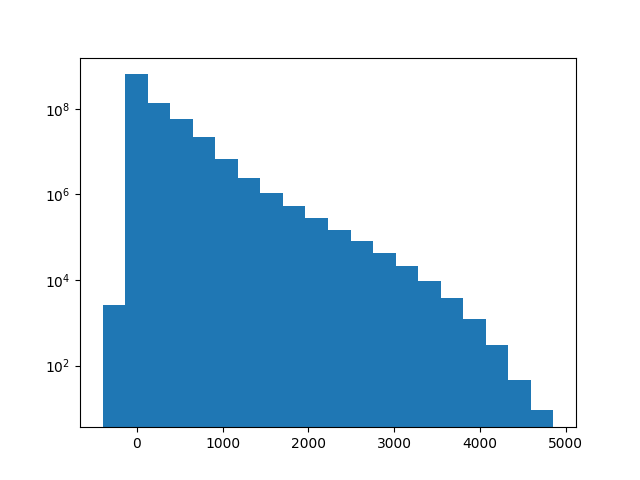

In [12]:
%matplotlib notebook
plt.hist(green_copy.flatten(), bins=20)
plt.gca().set_yscale("log")

In [13]:
mask_repeat = np.tile(np.expand_dims(mask, axis=0), (green_copy.shape[0], 1, 1))

In [14]:
np.putmask(green_copy, mask_repeat, 0)
np.putmask(green_copy, green_copy<0, 0)

<IPython.core.display.Javascript object>


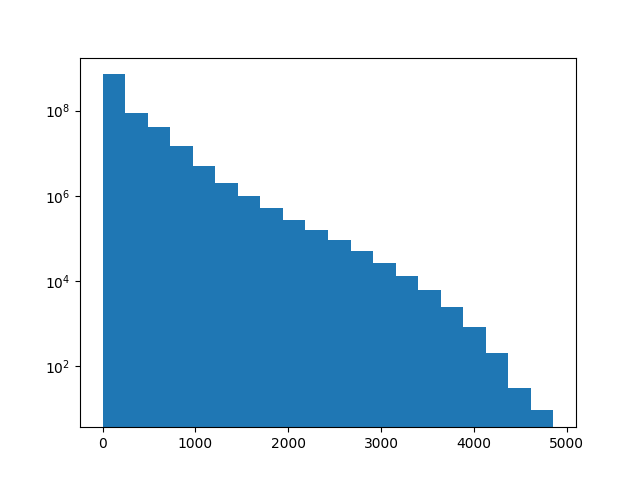

In [15]:
%matplotlib notebook
plt.hist(green_copy.flatten(), bins=20)
plt.gca().set_yscale("log")

<IPython.core.display.Javascript object>


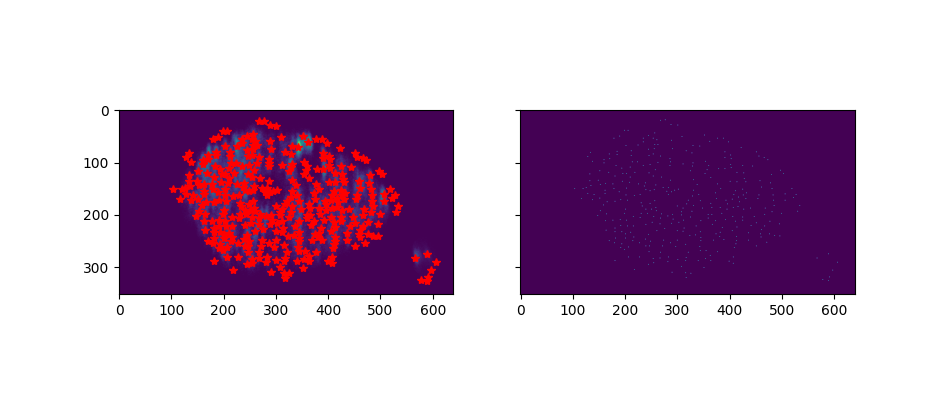

In [16]:
%matplotlib notebook
local_max = peak_local_max(green_copy[0], min_distance=5, threshold_abs=0.001)

fig, axs = plt.subplots(1,2, figsize=(9.5, 4), sharex=True, sharey=True)
axs[0].imshow(green_copy[0])
_ = [axs[0].plot(pixel[1], pixel[0], 'r*') for pixel in local_max]

collected_peaks = np.zeros_like(green_copy[0])
collected_peaks[[p[0] for p in local_max], [p[1] for p in local_max]] += 1
axs[1].imshow(collected_peaks)

In [17]:
collected_peaks = np.zeros_like(green_copy[0])
local_max_list = []

for g in tqdm(green_copy):
    local_max = peak_local_max(g, min_distance=5, threshold_abs=0.001)
    local_max_list.append(local_max)
    collected_peaks[[p[0] for p in local_max], [p[1] for p in local_max]] += 1

100%|██████████| 3840/3840 [01:14<00:00, 51.84it/s]


In [18]:
np.max(collected_peaks)

274.0

In [19]:
N_frames = len(green_copy)

<IPython.core.display.Javascript object>


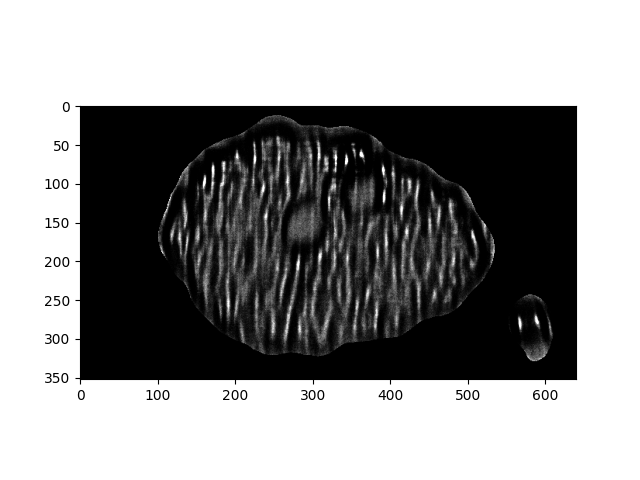

In [20]:
%matplotlib notebook
plt.imshow(collected_peaks / N_frames, cmap=plt.cm.get_cmap("Greys_r"), clim=[0, 0.025])

In [21]:
from scipy.ndimage.filters import gaussian_filter

In [22]:
green_copy_denoised = gaussian_filter(green_copy, sigma=(3,0,0))

In [23]:
collected_peaks2 = np.zeros_like(green_copy_denoised[0])
local_max_list2 = []

for g in tqdm(green_copy_denoised):
    local_max = peak_local_max(g, min_distance=5, threshold_abs=0.001)
    local_max_list2.append(local_max)
    collected_peaks2[[p[0] for p in local_max], [p[1] for p in local_max]] += 1

100%|██████████| 3840/3840 [00:48<00:00, 78.43it/s]


In [24]:
np.max(collected_peaks2)

794.0

In [25]:
green_copy_denoised2 = gaussian_filter(green_copy, sigma=(3,3,3))

In [26]:
collected_peaks3 = np.zeros_like(green_copy_denoised2[0])
local_max_list3 = []

for g in tqdm(green_copy_denoised2):
    local_max = peak_local_max(g, min_distance=5, threshold_abs=0.001)
    local_max_list3.append(local_max)
    collected_peaks3[[p[0] for p in local_max], [p[1] for p in local_max]] += 1

100%|██████████| 3840/3840 [00:13<00:00, 277.72it/s]


In [27]:
np.max(collected_peaks3)

1279.0

<IPython.core.display.Javascript object>


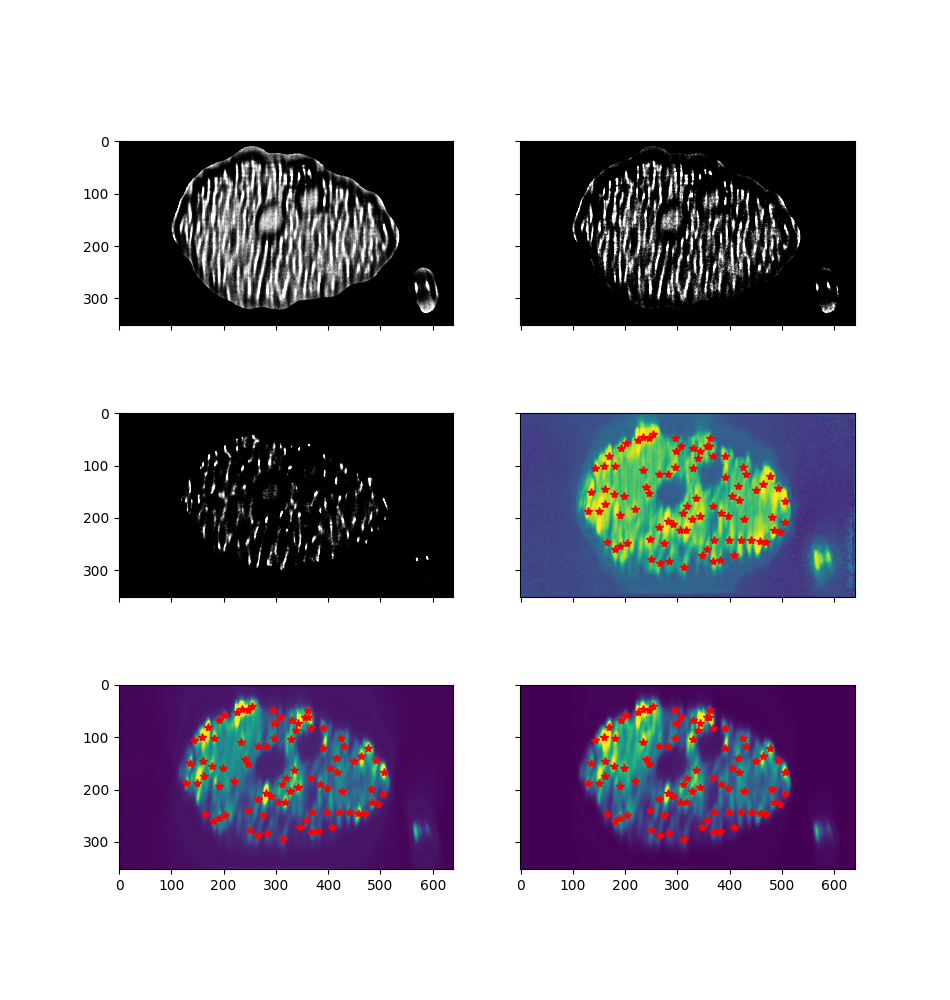

In [28]:
%matplotlib notebook
fig, axs = plt.subplots(3,2, figsize=(9.5, 10), sharex=True, sharey=True)

axs[0,0].imshow(collected_peaks / N_frames, cmap=plt.cm.get_cmap("Greys_r"), clim=[0, 0.01])
axs[0,1].imshow(collected_peaks2 / N_frames, cmap=plt.cm.get_cmap("Greys_r"), clim=[0, 0.01])
axs[1,0].imshow(collected_peaks3 / N_frames, cmap=plt.cm.get_cmap("Greys_r"), clim=[0, 0.01])
coordinates5 = peak_local_max(collected_peaks3 / N_frames, min_distance=10, threshold_abs=0.01)
# _ = [axs[1,0].plot(pixel[1], pixel[0], 'r+') for pixel in coordinates5]
# _ = [axs[1,0].plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]



axs[1,1].imshow(local_corrs[0], clim=[0, np.quantile(local_corrs[0], quantile)])
_ = [axs[1,1].plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]

axs[2,0].imshow(stds[0], clim=[0, np.quantile(stds[0], quantile)])
_ = [axs[2,0].plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]

axs[2,1].imshow(maxs[0], clim=[0, np.quantile(maxs[0], quantile)])
_ = [axs[2,1].plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]


mask_repeat = np.tile(np.expand_dims(mask, axis=0), (green_copy.shape[0], 1, 1))


In [29]:
N_trials = len(greens)

all_collected_peaks = []
all_local_max = []

for i_trial in tqdm(range(N_trials)):
    green = deepcopy(greens[i_trial])
    np.putmask(green, mask_repeat, 0)
    np.putmask(green, green<0, 0)
    green_denoised = gaussian_filter(green, sigma=(3,3,3))
    collected_peaks = np.zeros_like(green_copy_denoised2[0])
    local_max_list = []
    
    for g in green_denoised:
        local_max = peak_local_max(g, min_distance=5, threshold_abs=0.001)
        local_max_list.append(local_max)
        collected_peaks[[p[0] for p in local_max], [p[1] for p in local_max]] += 1
    all_collected_peaks.append(collected_peaks)
    all_local_max.append(local_max_list)

100%|██████████| 9/9 [07:16<00:00, 48.46s/it]


2

<IPython.core.display.Javascript object>


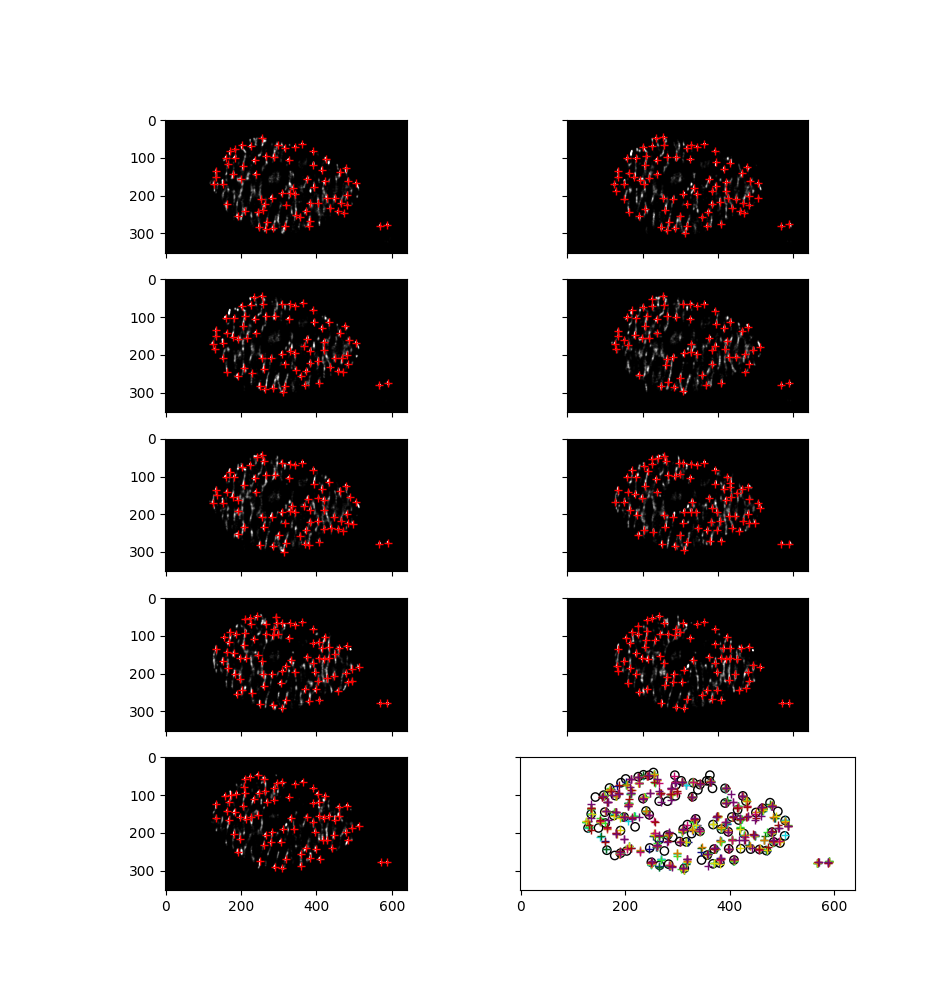

In [37]:
%matplotlib notebook
colors = [myplt.DARKBLUE,  myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN, myplt.DARKGREEN_CONTRAST, 
          myplt.DARKYELLOW, myplt.DARKORANGE,myplt.DARKPINK, myplt.DARKRED, myplt.DARKPURPLE]

fig, axs = plt.subplots(5,2, figsize=(9.5, 10), sharex=True, sharey=True)

for i_ax, ax in enumerate(axs.flatten()):
    if i_ax < N_trials:
        im_smooth = gaussian_filter(all_collected_peaks[i_ax]/N_frames, sigma=(1,1))
        ax.imshow(im_smooth, cmap=plt.cm.get_cmap("Greys_r"), clim=[0, 0.01] )
        coordinates5 = peak_local_max(im_smooth, min_distance=10, threshold_abs=0.01)
        _ = [ax.plot(pixel[1], pixel[0], 'r+') for pixel in coordinates5]
        _ = [axs.flatten()[-1].plot(pixel[1], pixel[0], '+', color=colors[i_ax]) for pixel in coordinates5]
        

        # _ = [ax.plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]
    else: 
        _ = [ax.scatter(pixel[1], pixel[0], facecolors='none', edgecolors='k') for pixel in roi_centers]
        # ax.axis("off")

In [10]:
all_collected_peaks = utils.get_stack(os.path.join(OUT_DIR, "test_peaks.tif"))
N_frames = 3840
N_trials = len(all_collected_peaks)

In [11]:
coords_trials = []

for i_trial in range(len(selected_trial_dirs)):
    im_smooth = gaussian_filter(all_collected_peaks[i_trial]/N_frames, sigma=(1,1))
    coordinates10 = peak_local_max(im_smooth, min_distance=10, threshold_abs=0.01)
    coords_trials.append(coordinates10)

In [12]:
thres_dist = 10

current_coords = coords_trials[0]
coords_sorted = np.ones((len(current_coords), len(selected_trial_dirs), 2))
coords_sorted[:,0,:] = coords_trials[0]
coord_inds = -1 * np.ones((len(current_coords), len(selected_trial_dirs))).astype(np.int16)
coord_inds[:,0] = np.arange(len(current_coords))
distances = -1 * np.ones((len(current_coords), len(selected_trial_dirs))).astype(np.int16)

for i_trial in range(1,len(selected_trial_dirs)):
    for i_coord, coord in enumerate(current_coords):
        dists = np.sqrt(np.sum(np.square(coords_trials[i_trial] - coord), axis=1))
        min_ind = np.argmin(dists)
        distances[i_coord, i_trial] = dists[min_ind]
        if dists[min_ind] < thres_dist and coord[1] < 550:
            current_coords[i_coord] = coords_trials[i_trial][min_ind]
            coord_inds[i_coord, i_trial] = min_ind
            coords_sorted[i_coord, i_trial] = coords_trials[i_trial][min_ind]
        else:
            coords_sorted[i_coord, i_trial] = coords_sorted[i_coord, i_trial-1]


In [13]:
np.sum(np.sum(coord_inds >= 0, axis=1) >= N_trials-1)

32

In [14]:
selected_coord_inds = coord_inds[np.sum(coord_inds >= 0, axis=1) >= N_trials-1, :]
selected_coords = coords_sorted[np.sum(coord_inds >= 0, axis=1) >= N_trials-1, :, :]

<IPython.core.display.Javascript object>


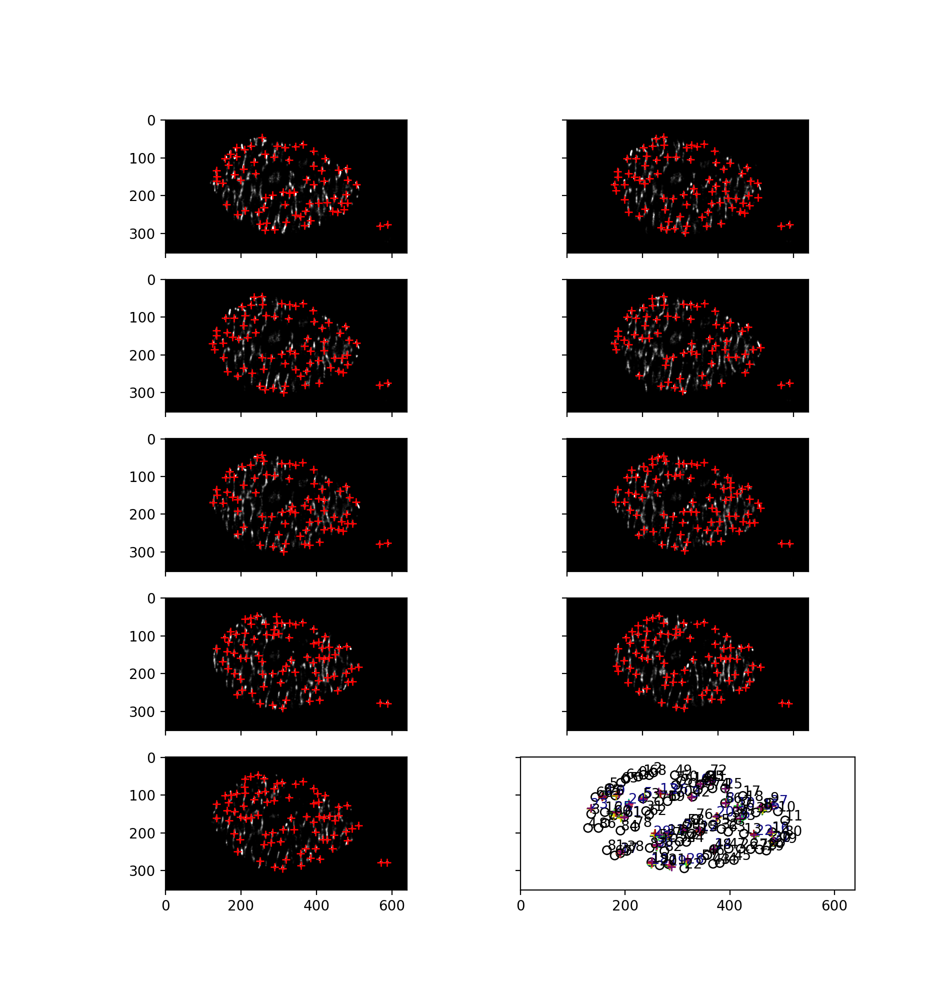

In [15]:
%matplotlib notebook
colors = [myplt.DARKBLUE,  myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN, myplt.DARKGREEN_CONTRAST, 
          myplt.DARKYELLOW, myplt.DARKORANGE,myplt.DARKPINK, myplt.DARKRED, myplt.DARKPURPLE]


fig, axs = plt.subplots(5,2, figsize=(9.5, 10), sharex=True, sharey=True)

for i_ax, ax in enumerate(axs.flatten()):
    if i_ax < N_trials:
        im_smooth = gaussian_filter(all_collected_peaks[i_ax]/N_frames, sigma=(1,1))
        ax.imshow(im_smooth, cmap=plt.cm.get_cmap("Greys_r"), clim=[0, 0.01])
        
        _ = [ax.plot(pixel[1], pixel[0], 'r+') for pixel in coords_trials[i_ax]]
        _ = [axs.flatten()[-1].plot(pixel[1], pixel[0], '+', color=colors[i_ax])
             for i_p, pixel in enumerate(selected_coords[:,i_ax,:])]
        if i_ax == 0:
            for i in range(len(selected_coords)):
                    axs.flatten()[-1].annotate(str(i), np.flip(selected_coords[i,i_ax,:]), color=colors[i_ax])
        

        # _ = [ax.plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]
    else: 
        _ = [ax.scatter(pixel[1], pixel[0], facecolors='none', edgecolors='k') for pixel in roi_centers]
        for i in range(len(roi_centers)):
                ax.annotate(str(i), np.flip(roi_centers[i]))
        # ax.axis("off")

### matching between corrected coordinates and original coordinates

In [28]:
matching_selected_manual = -1 * np.ones(len(selected_coords)).astype(np.int16)
distances_selected_manual = -1 * np.ones(len(selected_coords))
thres_dist = 5

for i_coord, coord in enumerate(np.mean(selected_coords, axis=1)):
    dists = np.sqrt(np.sum(np.square(roi_centers - coord), axis=1))
    min_ind = np.argmin(dists)
    distances_selected_manual[i_coord] = dists[min_ind]
    if dists[min_ind] < thres_dist:
        matching_selected_manual[i_coord] = min_ind

In [29]:
print(matching_selected_manual)
print(distances_selected_manual)

[40 41 15 42 55 53 -1 59 56  6 -1 23 25 -1 48  8 12 37 19 21 -1 30 -1 -1
 -1 -1 -1 -1 -1 -1 -1 61]
[ 2.23606798  2.74424201  0.70272837  2.39340658  1.94047213  2.44696839
  5.03076952  4.08550585  3.35915921  3.54512359  7.66747178  1.94047213
  0.91624569 20.93877023  1.84925744  1.5713484   1.18112731  0.99380799
  2.66898048  4.56097239 22.81135736  1.26686158 20.26552141 15.00370325
 31.52443693  6.5706042   9.44444444  7.09894793 18.48756673 14.98064595
 14.07212462  1.89215404]


In [25]:
selected_coords.shape

(32, 9, 2)

In [26]:
fly_processed_dir

'/mnt/NAS2/LH/210512/fly3/processed'

In [27]:
trial_dirs

['/mnt/NAS2/LH/210512/fly3/cs',
 '/mnt/NAS2/LH/210512/fly3/cs_001',
 '/mnt/NAS2/LH/210512/fly3/cs_002',
 '/mnt/NAS2/LH/210512/fly3/cs_003',
 '/mnt/NAS2/LH/210512/fly3/cs_caff',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_001',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_002',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_003',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_004',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_005',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_006',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_007',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_008']

In [30]:
fly_roi_centers_corrected_file = os.path.join(fly_processed_dir, "ROI_centers_corrected.pkl")
outdata = {"trials": trial_dirs,
           "selected_centers": selected_coords.astype(np.int16),
           "max_projections": all_collected_peaks,
           "matching_rois": matching_selected_manual,
           "matching_distances": distances_selected_manual}
with open(fly_roi_centers_corrected_file, "wb") as f:
    pickle.dump(outdata, f)
for i_trial, processed_dir in enumerate(processed_dirs):
    trial_roi_centers_corrected_file = os.path.join(processed_dir, "ROI_centers_corrected.txt")
    rois.write_roi_center_file(np.squeeze(selected_coords[:,i_trial, :]).astype(np.int16), trial_roi_centers_corrected_file)
    
fly_roi_centers_corrected_mean_file = os.path.join(fly_processed_dir, "ROI_centers_corrected_mean.txt")
rois.write_roi_center_file(np.mean(selected_coords, axis=1).astype(np.int16), fly_roi_centers_corrected_mean_file)

In [146]:
utils.save_stack(os.path.join(fly_processed_dir, "max_projections.tif"), all_collected_peaks)

In [147]:
fly_processed_dir

'/mnt/NAS2/LH/210512/fly3/processed'

In [49]:
from ipywidgets import interact, interactive, fixed, interact_manual, IntSlider

In [50]:
def plot_trial(trial):
    fig, axs = plt.subplots(1,1, figsize=(9.5, 6), sharex=True, sharey=True)
    
    axs.imshow(all_collected_peaks[trial]/N_frames, cmap=plt.cm.get_cmap("Greys_r"), clim=[0, 0.01] )
    """
    
    axs[0,1].imshow(local_corrs[trial], clim=[0, np.quantile(local_corrs[trial], quantile)])
    _ = [axs[0,1].plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]

    axs[1,0].imshow(stds[trial], clim=[0, np.quantile(stds[trial], quantile)])
    _ = [axs[1,0].plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]

    axs[1,1].imshow(maxs[trial], clim=[0, np.quantile(maxs[trial], quantile)])
    _ = [axs[1,1].plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]
    """

In [51]:
interact(plot_trial, trial=IntSlider(min=0, max=N_trials-1))

interactive(children=(IntSlider(value=0, description='trial', max=8), Output()), _dom_classes=('widget-interac…

<function __main__.plot_trial(trial)>

In [52]:
out_tif = np.array(all_collected_peaks)

In [53]:
utils.save_stack(os.path.join(OUT_DIR, "test_peaks.tif"), out_tif)

In [54]:
trial_dirs

['/mnt/NAS2/LH/210512/fly3/cs',
 '/mnt/NAS2/LH/210512/fly3/cs_001',
 '/mnt/NAS2/LH/210512/fly3/cs_002',
 '/mnt/NAS2/LH/210512/fly3/cs_003',
 '/mnt/NAS2/LH/210512/fly3/cs_caff',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_001',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_002',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_003',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_004',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_005',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_006',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_007',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_008']

In [58]:
N_trials = len(greens)

all_collected_peaks_raw = []
all_local_max_raw = []

for i_trial in tqdm(range(N_trials)):
    green = deepcopy(greens_raw[i_trial])
    np.putmask(green, mask_repeat, 0)
    np.putmask(green, green<0, 0)
    green_denoised = gaussian_filter(green, sigma=(3,3,3))
    collected_peaks = np.zeros_like(green_copy_denoised2[0])
    local_max_list = []
    
    for g in green_denoised:
        local_max = peak_local_max(g, min_distance=5, threshold_abs=0.001)
        local_max_list.append(local_max)
        collected_peaks[[p[0] for p in local_max], [p[1] for p in local_max]] += 1
    all_collected_peaks_raw.append(collected_peaks)
    all_local_max_raw.append(local_max_list)

100%|██████████| 9/9 [07:10<00:00, 47.79s/it]


In [59]:
utils.save_stack(os.path.join(OUT_DIR, "test_peaks_raw.tif"), np.array(all_collected_peaks_raw))

In [61]:
def plot_trial_raw(trial):
    fig, axs = plt.subplots(1,1, figsize=(9.5, 6), sharex=True, sharey=True)
    
    axs.imshow(all_collected_peaks_raw[trial]/N_frames, cmap=plt.cm.get_cmap("Greys_r"), clim=[0, 0.01] )
    """
    
    axs[0,1].imshow(local_corrs[trial], clim=[0, np.quantile(local_corrs[trial], quantile)])
    _ = [axs[0,1].plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]

    axs[1,0].imshow(stds[trial], clim=[0, np.quantile(stds[trial], quantile)])
    _ = [axs[1,0].plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]

    axs[1,1].imshow(maxs[trial], clim=[0, np.quantile(maxs[trial], quantile)])
    _ = [axs[1,1].plot(pixel[1], pixel[0], 'r*') for pixel in roi_centers]
    """
interact(plot_trial_raw, trial=IntSlider(min=0, max=N_trials-1))

interactive(children=(IntSlider(value=0, description='trial', max=8), Output()), _dom_classes=('widget-interac…

<function __main__.plot_trial_raw(trial)>

# check the ROI signals

In [31]:
"""
fly_roi_centers_corrected_file = os.path.join(fly_processed_dir, "ROI_centers_corrected.pkl")
outdata = {"trials": trial_dirs,
           "selected_centers": selected_coords.astype(np.int16),
           "max_projections": all_collected_peaks,
           "matching_rois": matching_selected_manual,
           "matching_distances": distances_selected_manual}
with open(fly_roi_centers_corrected_file, "wb") as f:
    pickle.dump(outdata, f)
for i_trial, processed_dir in enumerate(processed_dirs):
    trial_roi_centers_corrected_file = os.path.join(processed_dir, "ROI_centers_corrected.txt")
    rois.write_roi_center_file(np.squeeze(selected_coords[:,i_trial, :]).astype(np.int16), trial_roi_centers_corrected_file)
    
fly_roi_centers_corrected_mean_file = os.path.join(fly_processed_dir, "ROI_centers_corrected_mean.txt")
rois.write_roi_center_file(np.mean(selected_coords, axis=1).astype(np.int16), fly_roi_centers_corrected_mean_file)
"""


'\nfly_roi_centers_corrected_file = os.path.join(fly_processed_dir, "ROI_centers_corrected.pkl")\noutdata = {"trials": trial_dirs,\n           "selected_centers": selected_coords.astype(np.int16),\n           "max_projections": all_collected_peaks,\n           "matching_rois": matching_selected_manual,\n           "matching_distances": distances_selected_manual}\nwith open(fly_roi_centers_corrected_file, "wb") as f:\n    pickle.dump(outdata, f)\nfor i_trial, processed_dir in enumerate(processed_dirs):\n    trial_roi_centers_corrected_file = os.path.join(processed_dir, "ROI_centers_corrected.txt")\n    rois.write_roi_center_file(np.squeeze(selected_coords[:,i_trial, :]).astype(np.int16), trial_roi_centers_corrected_file)\n    \nfly_roi_centers_corrected_mean_file = os.path.join(fly_processed_dir, "ROI_centers_corrected_mean.txt")\nrois.write_roi_center_file(np.mean(selected_coords, axis=1).astype(np.int16), fly_roi_centers_corrected_mean_file)\n'

In [35]:
neural_dfs = []
neural_dfs_corrected = []
neural_dfs_corrected_mean = []
for i_trial, trial_dir in enumerate(selected_trial_dirs):
    neural_df_dir = os.path.join(trial_dir, "processed", "twop_df.pkl")
    neural_df_dir_corrected = os.path.join(trial_dir, "processed", "twop_df_corrected.pkl")
    neural_df_dir_corrected_mean = os.path.join(trial_dir, "processed", "twop_df_corrected_mean.pkl")
    neural_dfs.append(pd.read_pickle(neural_df_dir))
    neural_dfs_corrected.append(pd.read_pickle(neural_df_dir_corrected))
    neural_dfs_corrected_mean.append(pd.read_pickle(neural_df_dir_corrected_mean))

In [40]:
neural_dfs[0].filter(regex="neuron")

neuron_0    neuron_1  \
Date   Genotype Fly TrialName Trial Frame                            
210512 J1xM5    3   cs        0     0       601.600895  342.855522   
                                    1       607.614473  203.389046   
                                    2       822.170104  244.154745   
                                    3       655.808191  332.381370   
                                    4       735.970275  163.865796   
...                                                ...         ...   
                                    3835   1021.056210  393.490739   
                                    3836    998.222638  397.842971   
                                    3837    823.973718  469.893379   
                                    3838    795.698101  270.197781   
                                    3839   1219.521451  261.707991   

                                             neuron_2    neuron_3    neuron_4  \
Date   Genotype Fly TrialName Trial Frame                                       
210512 J1xM5    3   cs        0     0      395.039290  282.511867   87.016337   
                                    1      470.360583  254.687043  129.675408   
                                    2      497.935263  145.310196  123.350482   
                                    3      368.758046  206.538909  112.824144   
                                    4      510.288019  188.189986  140.988424   
...                                               ...         ...         ...   
                                    3835   817.001256  171.339191  222.457789   
                                    3836   622.273046  254.871495  222.143168   
                                    3837   730.833456  261.096937  170.037463   
                                    3838   704.223905  161.065824  190.940617   
                                    3839   604.740668  232.336370  142.779493   

                                              neuron_5     neuron_6  \
Date   Genotype Fly TrialName Trial Frame                             
210512 J1xM5    3   cs        0     0      1475.380873   786.785461   
                                    1      1534.516868   784.690865   
                                    2      1566.001822   818.328941   
                                    3      1315.268501   732.486489   
                                    4      1316.110601  1037.483681   
...                                                ...          ...   
                                    3835   1693.079271  1115.153232   
                                    3836   1646.454885  1137.344171   
                                    3837   1808.373473  1068.553256   
                                    3838   1551.558342  1342.104097   
                                    3839   1811.976415  1206.513079   

                                             neuron_7     neuron_8  \
Date   Genotype Fly TrialName Trial Frame                            
210512 J1xM5    3   cs        0     0      519.863762   876.760241   
                                    1      602.487681   854.802354   
                                    2      511.079466   924.371555   
                                    3      590.307330   669.140955   
                                    4      649.788588   654.843434   
...                                               ...          ...   
                                    3835   591.092677   987.110613   
                                    3836   668.988464  1054.200127   
                                    3837   607.572383   987.452397   
                                    3838   549.189972  1076.634496   
                                    3839   486.207079   960.556791   

                                             neuron_9  ...   neuron_77  \
Date   Genotype Fly TrialName Trial Frame              ...               
210512 J1xM5    3   cs        0     0      547.911330  ...  471.304978   
                        

In [38]:
matching_selected_manual

array([40, 41, 15, 42, 55, 53, -1, 59, 56,  6, -1, 23, 25, -1, 48,  8, 12,
       37, 19, 21, -1, 30, -1, -1, -1, -1, -1, -1, -1, -1, -1, 61],
      dtype=int16)

In [41]:
neural_dfs_matched = deepcopy(neural_dfs_corrected)
for i_trial in range(len(neural_dfs_matched)):
    for i_neuron, i_match in enumerate(matching_selected_manual):
        if i_match != -1:
            neural_dfs_matched[i_trial]["neuron_{}".format(i_neuron)] = neural_dfs[i_trial]["neuron_{}".format(i_match)]
        else:
            neural_dfs_matched[i_trial]["neuron_{}".format(i_neuron)] = np.zeros(len(neural_dfs[i_trial]))
    

In [42]:
neural_dfs_matched[0]

t     neuron_0  \
Date   Genotype Fly TrialName Trial Frame                            
210512 J1xM5    3   cs        0     0        1.847900  2739.233625   
                                    1        1.909500  2691.149549   
                                    2        1.971067  2824.173073   
                                    3        2.032667  2618.632969   
                                    4        2.094267  2559.356131   
...                                               ...          ...   
                                    3835   238.069800  2478.719759   
                                    3836   238.131400  2263.882175   
                                    3837   238.193000  2259.997618   
                                    3838   238.254600  2311.642927   
                                    3839   238.316200  2113.362404   

                                              neuron_1    neuron_2  \
Date   Genotype Fly TrialName Trial Frame                            
210512 J1xM5    3   cs        0     0      2068.245097  702.069753   
                                    1      1948.928373  867.476803   
                                    2      1822.257066  865.489747   
                                    3      1785.793017  907.567515   
                                    4      1917.048811  803.879222   
...                                                ...         ...   
                                    3835   1382.355005  589.906083   
                                    3836   1526.885825  692.639924   
                                    3837   1396.035258  629.439973   
                                    3838   1363.548419  553.919534   
                                    3839   1225.664271  544.424395   

                                              neuron_3     neuron_4  \
Date   Genotype Fly TrialName Trial Frame                             
210512 J1xM5    3   cs        0     0      1170.472814  1303.585093   
                                    1       936.896047  1211.536661   
                                    2      1035.005891  1161.620106   
                                    3       915.195790  1255.049772   
                                    4      1036.612719  1455.380810   
...                                                ...          ...   
                                    3835    893.629588  1285.345785   
                                    3836    976.544016  1442.267591   
                                    3837    984.178665  1330.470936   
                                    3838    920.226520  1359.715033   
                                    3839    906.055439  1229.726526   

                                              neuron_5  neuron_6    neuron_7  \
Date   Genotype Fly TrialName Trial Frame                                      
210512 J1xM5    3   cs        0     0      1255.748455       0.0  367.343349   
                                    1      1002.343587       0.0  509.555843   
                                    2      1157.081401       0.0  474.807020   
                                    3      1029.011940       0.0  562.556908   
                                    4       939.442416       0.0  503.170584   
...                                                ...       ...         ...   
                                    3835   1007.630469       0.0  465.020803   
                                    3836    978.588613       0.0  556.185272   
                                    3837   1182.474536       0.0  527.085541   
                                    3838   1066.516739       0.0  481.135856   
                                    3839    943.138366       0.0  647.746013   

                                              neuron_8  ...  neuron_22  \
Date   Genotype Fly TrialName Trial Frame               ...              
210512 J1xM5    3   cs        0     0      1269.797777  ...        0.0   
                                    1      

In [43]:
len(neural_dfs_matched)

9

In [62]:
selected_trial_dirs

['/mnt/NAS2/LH/210512/fly3/cs',
 '/mnt/NAS2/LH/210512/fly3/cs_002',
 '/mnt/NAS2/LH/210512/fly3/cs_003',
 '/mnt/NAS2/LH/210512/fly3/cs_caff',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_003',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_004',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_006',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_008']

In [63]:
i_trials

[0, 2, 3, 4, 5, 8, 9, 11, 13]

<IPython.core.display.Javascript object>


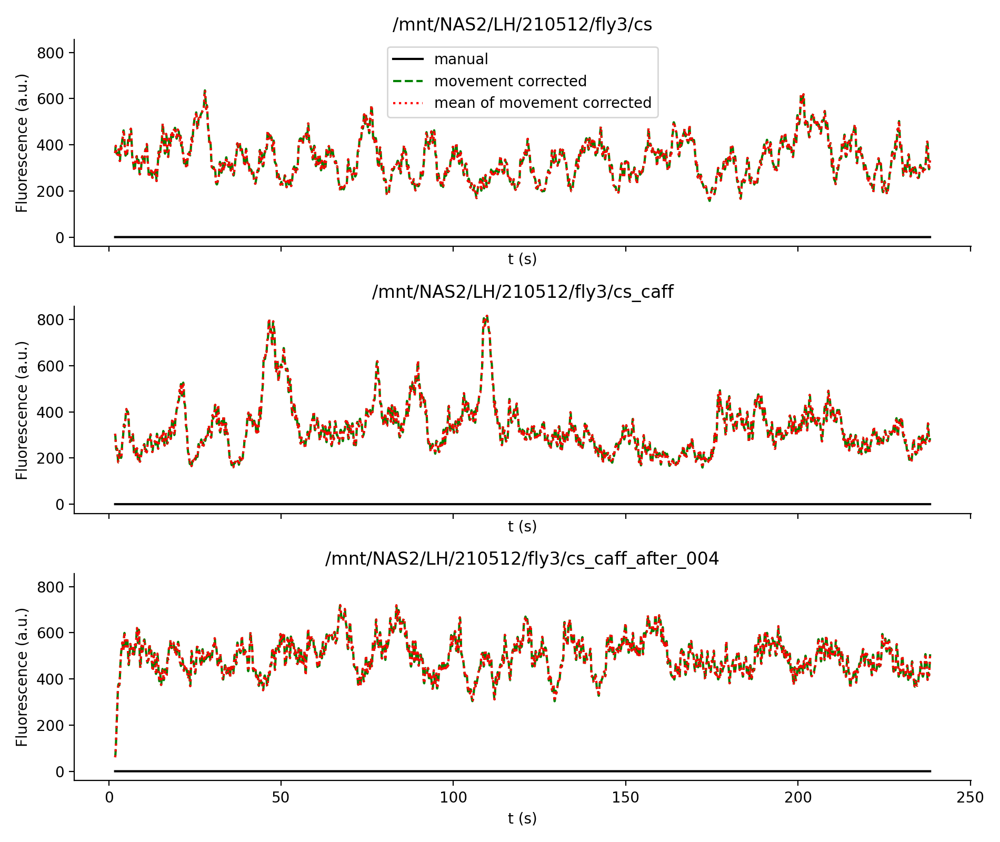

In [187]:
%matplotlib notebook

this_i_trials = [0,3,6]
i_neuron = 29

def this_filter(signal, sigma=2):
    return gaussian_filter1d(signal, sigma=sigma, axis=0)

fig, axs = plt.subplots(len(this_i_trials),1, figsize=(9.5,8), sharex=True, sharey=True)
for (i_trial, ax) in zip(this_i_trials, axs):
    ax.plot(neural_dfs_matched[i_trial]["t"],this_filter(neural_dfs_matched[i_trial].filter(regex="neuron").iloc[:,i_neuron].values), 
            "k", label="manual")
    ax.plot(neural_dfs_matched[i_trial]["t"],this_filter(neural_dfs_corrected[i_trial].filter(regex="neuron").iloc[:,i_neuron].values), 
            "g--", label="movement corrected")
    ax.plot(neural_dfs_matched[i_trial]["t"],this_filter(neural_dfs_corrected_mean[i_trial].filter(regex="neuron").iloc[:,i_neuron].values), 
            "r:", label="mean of movement corrected")
    ax.set_xlabel("t (s)")
    ax.set_ylabel("Fluorescence (a.u.)")
    ax.set_title(selected_trial_dirs[i_trial])
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    if i_trial == 0:
        ax.legend()
fig.tight_layout()

In [140]:
# fly_dir
all_i_trials = [0, 2, 3, 5, 8, 9, 11, 13]
condition = "12.05. water"
compare_i_trials = [2,5,11]
thres_rest = 0.01
thres_walk = 0.035
"""
trial_names = ["long before", "medium before", "right before", 
               "right after 1", "right after 2", 
               "long after 1", "long after 2", "long after 3"]
"""
trial_names = ["before 1", "before 3", "before 4", 
               "right after 1", "right after 4", 
               "long after 1", "long after 3", "long after 5"]

In [102]:
selected_trial_dirs

['/mnt/NAS2/LH/210512/fly3/cs',
 '/mnt/NAS2/LH/210512/fly3/cs_002',
 '/mnt/NAS2/LH/210512/fly3/cs_003',
 '/mnt/NAS2/LH/210512/fly3/cs_caff',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_003',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_004',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_006',
 '/mnt/NAS2/LH/210512/fly3/cs_caff_after_008']

In [126]:
from longterm import analysis as an
an = reload(an)

In [118]:
pcan_manual = analysis.InterPCAAnalysis(fly_dir=fly_dir, 
                                 i_trials=all_i_trials, 
                                 condition=condition + " manual ROIs", 
                                 compare_i_trials=compare_i_trials, 
                                 thres_walk=thres_walk, 
                                 thres_rest=thres_rest,
                                 load_df=True, 
                                 load_pixels=False, 
                                 pixel_shape=None, 
                                 sigma=1, # 0  # 1  # 3 
                                 trial_names=trial_names,
                                 twop_df_name="twop_df.pkl")

Read the centers of 87 ROIs from file


In [119]:
pcan_corrected = analysis.InterPCAAnalysis(fly_dir=fly_dir, 
                                 i_trials=all_i_trials, 
                                 condition=condition + " corrected ROIs", 
                                 compare_i_trials=compare_i_trials, 
                                 thres_walk=thres_walk, 
                                 thres_rest=thres_rest,
                                 load_df=True, 
                                 load_pixels=False, 
                                 pixel_shape=None, 
                                 sigma=1, # 0  # 1  # 3 
                                 trial_names=trial_names,
                                 twop_df_name="twop_df_corrected.pkl")

Read the centers of 87 ROIs from file


In [121]:
pcan_corrected_mean = analysis.InterPCAAnalysis(fly_dir=fly_dir, 
                                 i_trials=all_i_trials, 
                                 condition=condition + " mean corrected ROIs", 
                                 compare_i_trials=compare_i_trials, 
                                 thres_walk=thres_walk, 
                                 thres_rest=thres_rest,
                                 load_df=True, 
                                 load_pixels=False, 
                                 pixel_shape=None, 
                                 sigma=1, # 0  # 1  # 3 
                                 trial_names=trial_names,
                                 twop_df_name="twop_df_corrected_mean.pkl")

Read the centers of 87 ROIs from file


In [122]:
pcans = [pcan_manual, pcan_corrected, pcan_corrected_mean]

In [123]:
for pcan in pcans:
    pcan.sort_neurons()
    w = pcan.get_w_inter_pca_walk_rest_neurons()
    pcan.get_covs_walk_rest_neurons()
    pcan.get_covs_inter_trial_neurons()
    pcan.get_inter_pca_trials_neurons()
    pcan.get_inter_condition_variance_ratios_neurons()

<IPython.core.display.Javascript object>


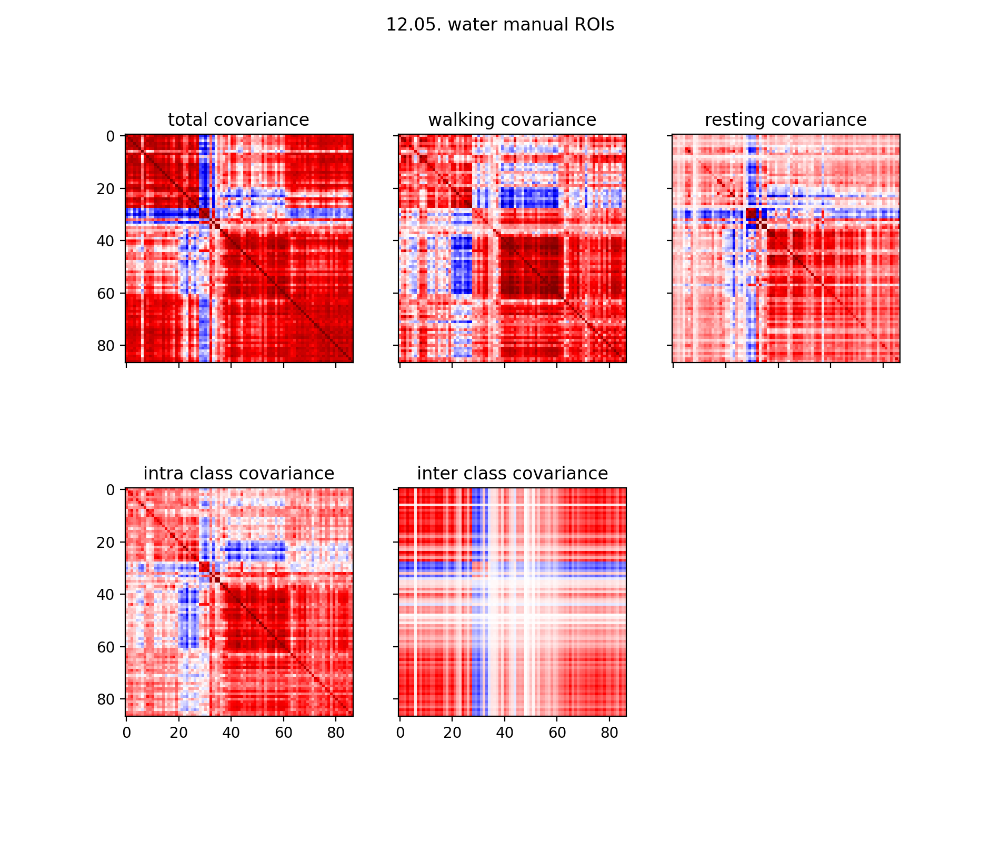

<IPython.core.display.Javascript object>


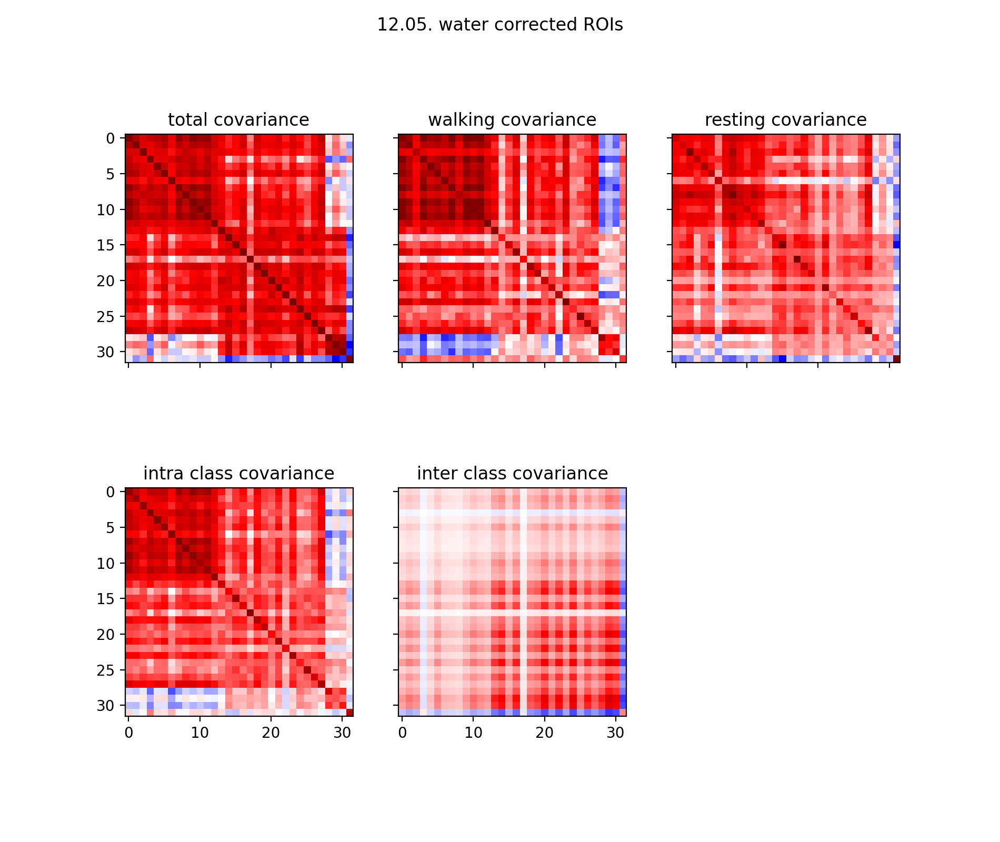

<IPython.core.display.Javascript object>


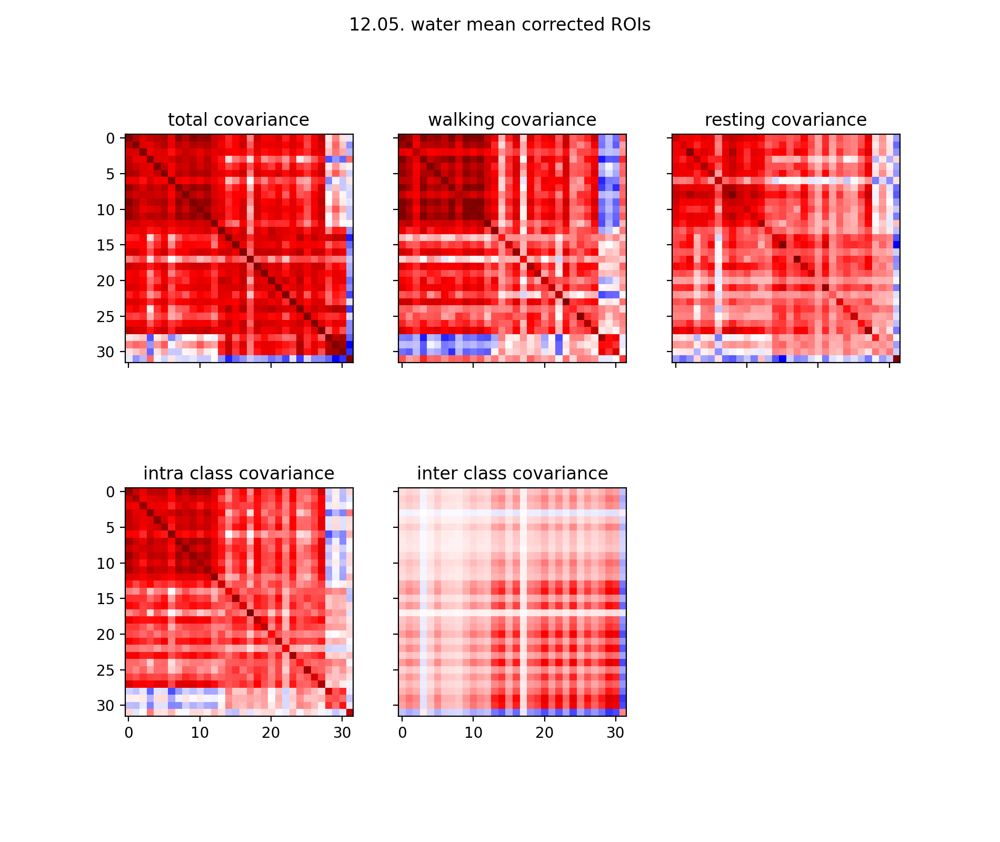

In [131]:
%matplotlib notebook

for pcan in pcans:
    fig, axs = plt.subplots(2,3,figsize=(9.5, 8), sharex=True, sharey=True)
    clim = [np.quantile(pcan.cov_neurons, 0.01), np.quantile(pcan.cov_neurons, 0.99)]
    clim = [-1,1]
    axs[0,0].imshow(pcan.cov_neurons, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[0,0].set_title("total covariance")
    axs[0,1].imshow(pcan.cov_neurons_walk, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[0,1].set_title("walking covariance")
    axs[0,2].imshow(pcan.cov_neurons_rest, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[0,2].set_title("resting covariance")
    axs[1,0].imshow(pcan.cov_neurons_rest_walk_intra, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[1,0].set_title("intra class covariance")
    axs[1,1].imshow(pcan.cov_neurons_rest_walk_inter, clim=clim, cmap=plt.cm.get_cmap("seismic"))
    axs[1,1].set_title("inter class covariance")
    axs[1,2].axis("off")
    fig.suptitle(pcan.condition)

<IPython.core.display.Javascript object>


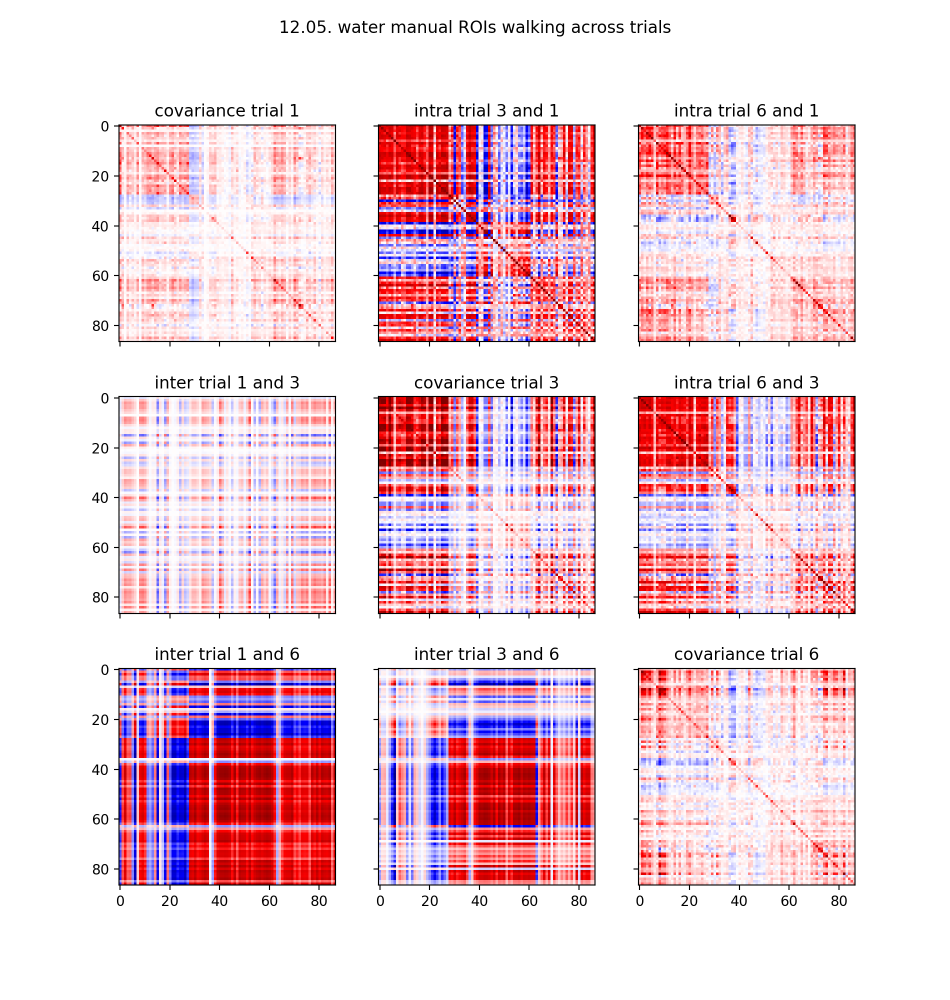

<IPython.core.display.Javascript object>


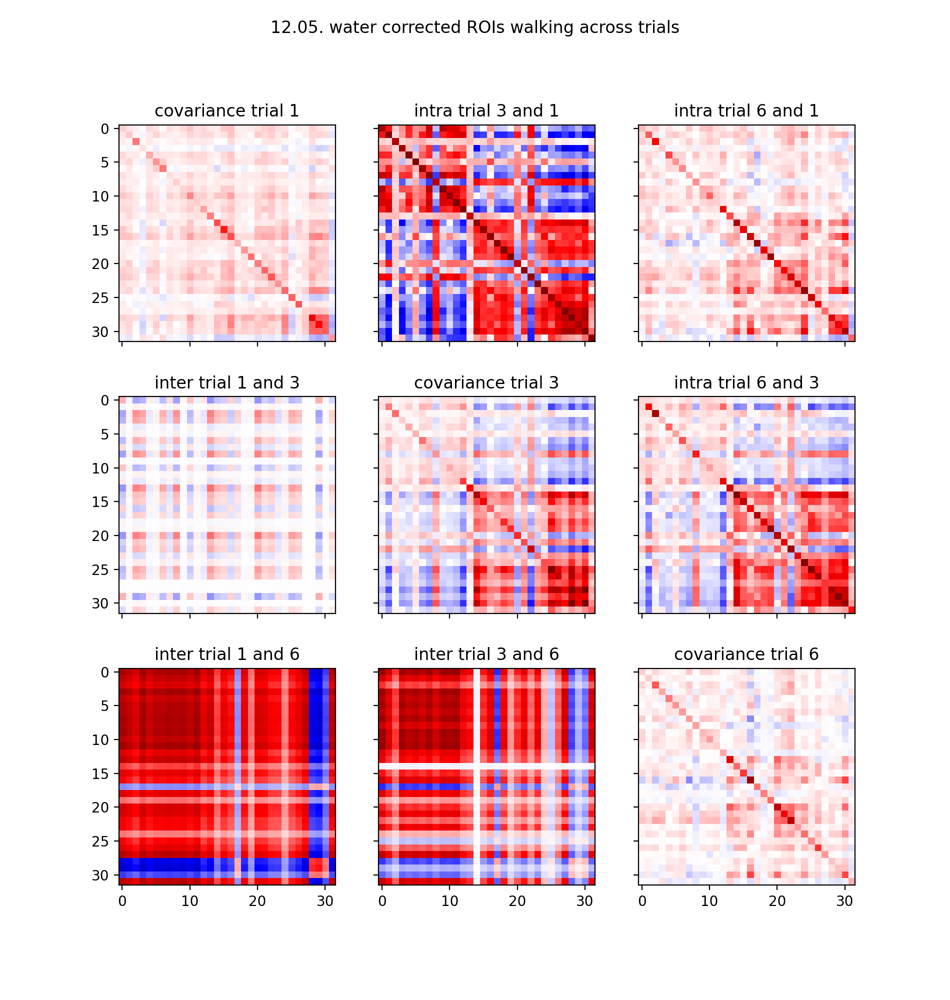

<IPython.core.display.Javascript object>


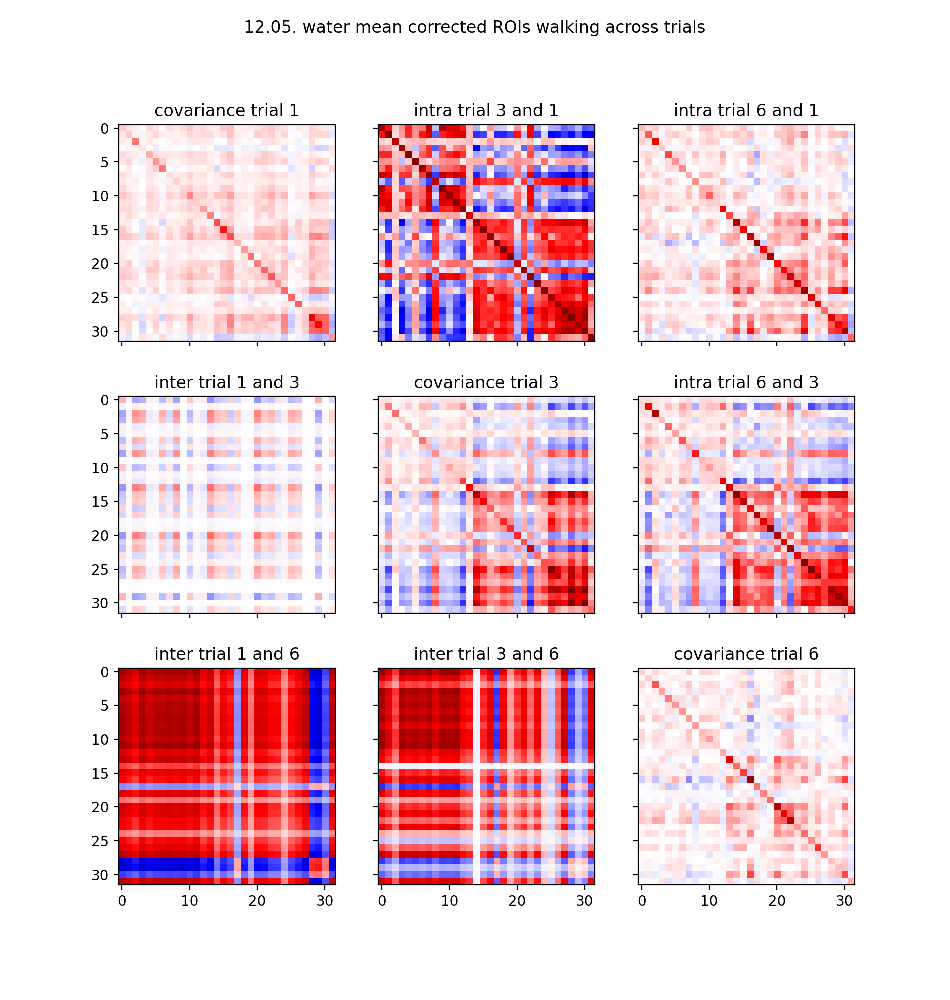

In [132]:
%matplotlib notebook
for pcan in pcans:
    an.plot_cov_matrix(pcan.cov_neurons_matrix_walk, trials=[1,3,6], clim=[-1,1], name=pcan.condition+" walking across trials")

<IPython.core.display.Javascript object>


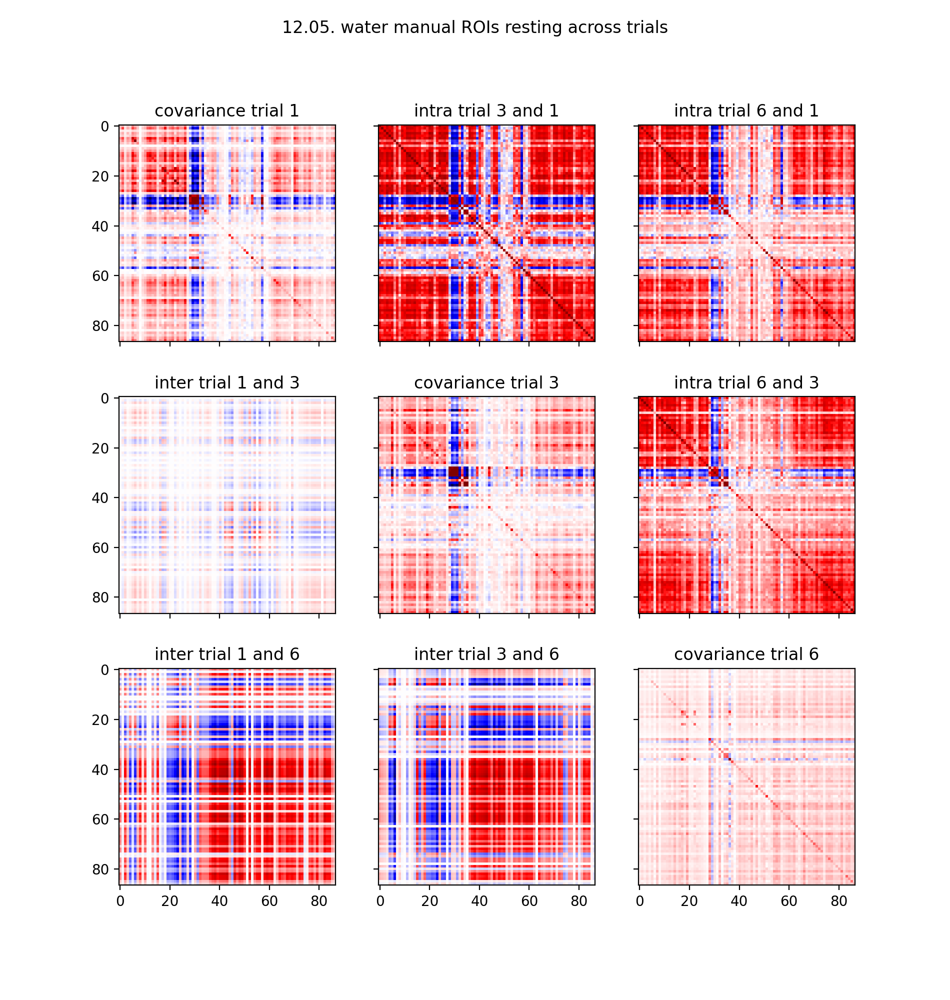

<IPython.core.display.Javascript object>


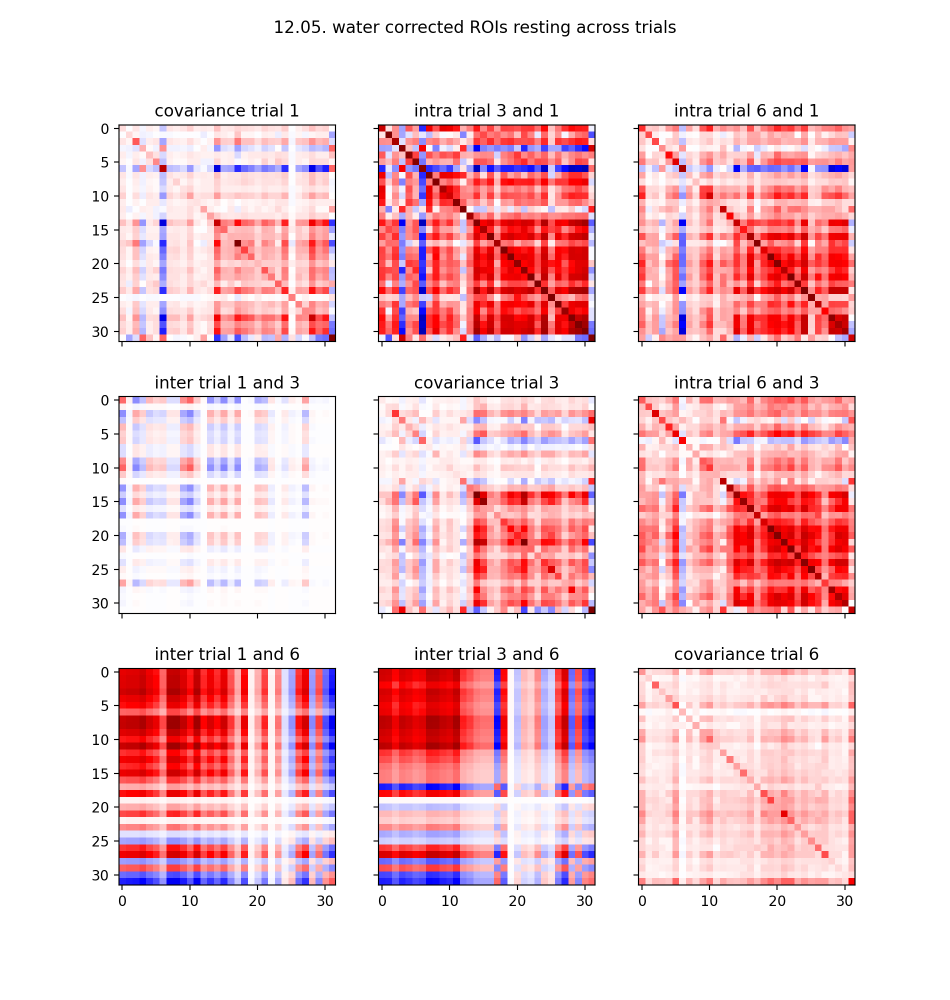

<IPython.core.display.Javascript object>


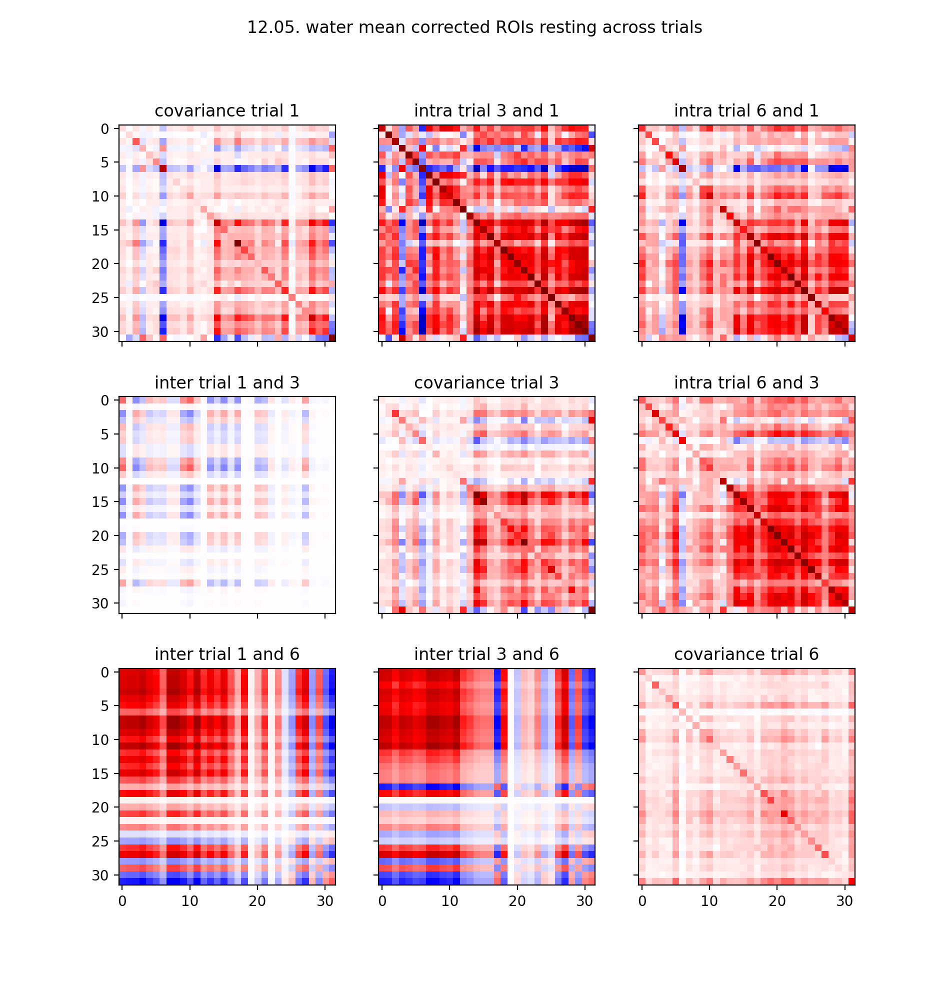

In [133]:
%matplotlib notebook
for pcan in pcans:
    an.plot_cov_matrix(pcan.cov_neurons_matrix_rest, trials=[1,3,6], clim=[-1,1], name=pcan.condition+" resting across trials")

<IPython.core.display.Javascript object>


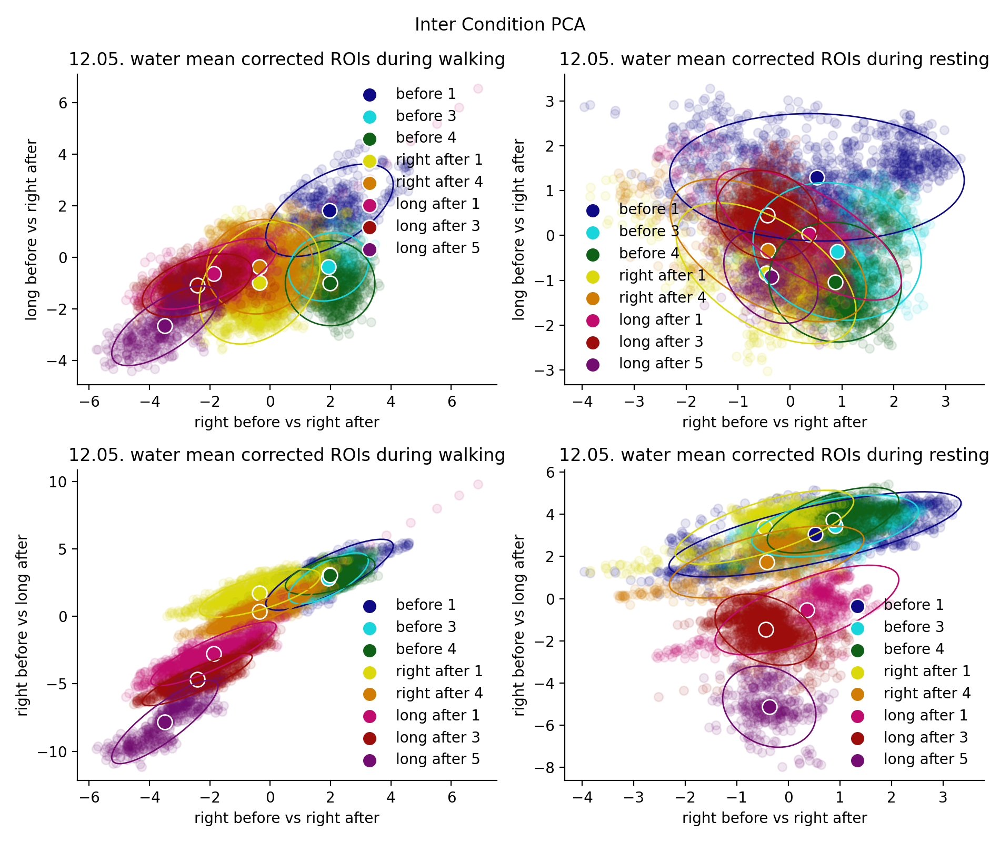

In [153]:
%matplotlib notebook

# colors_long = [myplt.BLACK, myplt.DARKBLUE, myplt.DARKGREEN, myplt.DARKYELLOW, myplt.DARKORANGE, myplt.DARKRED]
# colors_contrast_long = [myplt.DARKGRAY, myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN_CONTRAST, myplt.DARKPINK, myplt.DARKPURPLE, myplt.DARKBROWN]
colors_long = [myplt.DARKBLUE,  myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN, # myplt.DARKGREEN_CONTRAST, 
          myplt.DARKYELLOW, myplt.DARKORANGE,myplt.DARKPINK, myplt.DARKRED, myplt.DARKPURPLE]
colors_contrast_long = colors_long
# colors = [myplt.DARKBLUE, myplt.DARKYELLOW, myplt.DARKRED]
# colors_contrast = [myplt.DARKBLUE_CONTRAST,myplt.DARKPINK, myplt.DARKBROWN]
# order = [0,4,1,5,2,3]

fig, axs = plt.subplots(2,2, figsize=(9.5,8))  # , sharex="col", sharey="col")
    
i_fly = 2
pcan = pcans[i_fly]

long_bef = 0
short_bef = 2
right_aft = 3
long_aft = 6

an.plot_proj_scatter(w_1=pcan.w_inter_pca_walk_neurons[short_bef,right_aft], w_2=pcan.w_inter_pca_walk_neurons[long_bef,short_bef],
             X_trials=pcan.neurons_walk, trials=[0,1,2,3,4,5,6,7], w_names=["right before vs right after", "long before vs right after"],
             X_names=pcan.trial_names, 
             fig=fig, ax=axs[0,0], alpha=0.1, name=pcan.condition+" during walking",colors=colors_long)
an.plot_proj_scatter(w_1=pcan.w_inter_pca_rest_neurons[short_bef,right_aft], w_2=pcan.w_inter_pca_rest_neurons[long_bef,short_bef],
             X_trials=pcan.neurons_rest, trials=[0,1,2,3,4,5,6,7], w_names=["right before vs right after", "long before vs right after"],
             X_names=pcan.trial_names, 
             fig=fig, ax=axs[0,1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast_long)

an.plot_proj_scatter(w_1=pcan.w_inter_pca_walk_neurons[short_bef,right_aft], w_2=pcan.w_inter_pca_walk_neurons[short_bef,long_aft],
             X_trials=pcan.neurons_walk, trials=[0,1,2,3,4,5,6,7], w_names=["right before vs right after", "right before vs long after"],
             X_names=pcan.trial_names, 
             fig=fig, ax=axs[1,0], alpha=0.1, name=pcan.condition+" during walking",colors=colors_long)
an.plot_proj_scatter(w_1=pcan.w_inter_pca_rest_neurons[short_bef,right_aft], w_2=pcan.w_inter_pca_rest_neurons[short_bef,long_aft],
             X_trials=pcan.neurons_rest, trials=[0,1,2,3,4,5,6,7], w_names=["right before vs right after", "right before vs long after"],
             X_names=pcan.trial_names, 
             fig=fig, ax=axs[1,1], alpha=0.1, name=pcan.condition+" during resting",colors=colors_contrast_long)

fig.suptitle("Inter Condition PCA")
fig.tight_layout()

In [135]:
len(pcan.trial_names)

8